# Visualization of Single-Use Plastic Bag Usage at Retail Stores After Implementing a "Bag Tax"

## Question

Does implementing a charge for single use plastic bags ("Bag Tax") lead to less overall usage?

Variables:
- Date: Preferably over more than a few years to hopefully observe the expected consumer behavior change even if it is slow.
- Number of Plastic Bags Bought: Should go down over time if the charge for plastic bags had it's intended effect.

## Dataset Used

"Bag Tax" by Montgomery County of Maryland

https://data.montgomerycountymd.gov/Finance-Tax-Property/Bag-Tax/xnjh-vgc4

Accessed 8/8/21

In [1]:
#Importing required libraries
import numpy as np
import pandas as pd 

import plotly.express as px
import plotly.graph_objects as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import cufflinks as cf

In [2]:
#Read in Bag_Tax.csv
data = pd.read_csv("Bag_Tax.csv")

data.shape
data.head()

,File ID,Account,Date From,Date To,Bag Count,Amount Collected,Amount Due,Amount Retained,Create Date,Vendor Name,City,State,Zip code,Location1
0,68385,863,10/1/2020,10/31/2020,454,22.7,18.16,4.54,11/18/2020,The Orvis Company Inc,NaN,VT,5250,"VT 05250\n(43.103015, -73.177194)"
1,57463,1470,7/1/2019,7/31/2019,0,0.0,0.00,0.00,8/20/2019,ELC BEAUTY LLC,NaN,NY,11747,"NY 11747\n(40.788271, -73.408441)"
2,46402,1470,4/1/2018,4/30/2018,0,0.0,0.00,0.00,5/15/2018,ELC BEAUTY LLC,NaN,NY,11747,"NY 11747\n(40.788271, -73.408441)"
3,65348,1300,8/23/2019,6/26/2020,8000,400.0,320.00,80.00,6/26/2020,kadhai inc,NaN,MD,22014,MD 22014
4,57483,3642,7/1/2019,7/31/2019,3424,171.2,136.96,34.24,8/20/2019,District Taco LLC,NaN,VA,22042,"VA 22042\n(38.866025, -77.193002)"


In [3]:
#Convert dates to YYYY-MM-DD format
data['Date From'] = pd.to_datetime(data['Date From'])
#data['Date To'] = pd.to_datetime(data['Date To'])

#Sort by date (Using 'Date From' as the x-axis for visualizations, so sorting by that)
data.sort_values(by=['Date From'])

,File ID,Account,Date From,Date To,Bag Count,Amount Collected,Amount Due,Amount Retained,Create Date,Vendor Name,City,State,Zip code,Location1
35148,2259,845,1931-03-01,3/31/2012,333,16.65,13.32,3.33,6/19/2012,Drug Depot,Chevy Chase,MD,20815,"Chevy Chase, MD 20815\n(38.982537, -77.079131)"
23227,2264,765,1931-05-01,5/31/2012,3905,195.25,156.20,39.05,6/19/2012,"Chevy Chase Marketing, Inc",Chevy Chase,MD,20815,"Chevy Chase, MD 20815\n(38.982537, -77.079131)"
30806,28985,646,2001-10-01,10/31/2016,2110,105.50,84.40,21.10,11/21/2016,J.M. Hollister LLC,NaN,OH,43054,"OH 43054\n(40.082338, -82.813305)"
37176,1485,606,2003-01-01,5/9/2012,2131,106.55,85.24,21.31,5/9/2012,Capital Beer & Wine,Bethesda,MD,20814,"Bethesda, MD 20814\n(39.003061, -77.102949)"
33751,11646,431,2003-11-21,12/20/2003,81,4.05,3.24,0.81,12/29/2013,Bulman Enterprises Inc,Bethesda,MD,20814,"Bethesda, MD 20814\n(39.003061, -77.102949)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54748,74866,434,2021-06-01,6/30/2021,732,36.60,29.28,7.32,7/19/2021,"OFFICE DEPOT, INC.",NaN,FL,33496,"FL 33496\n(26.406654, -80.162127)"
54840,74801,207,2021-06-02,6/29/2021,1169,58.45,46.76,11.69,7/16/2021,Yogiraj Corporation,Germantown,MD,20876,"Germantown, MD 20876\n(39.198155, -77.240725)"
54938,74802,208,2021-06-02,6/29/2021,2921,146.05,116.84,29.21,7/16/2021,Hari Corporation,Germantown,MD,20876,"Germantown, MD 20876\n(39.198155, -77.240725)"
55220,74965,33,2021-06-22,7/21/2021,0,0.00,0.00,0.00,7/22/2021,A&H Seafood Market Partners LLC,Kensington,MD,20895,"Kensington, MD 20895\n(39.027698, -77.077422)"


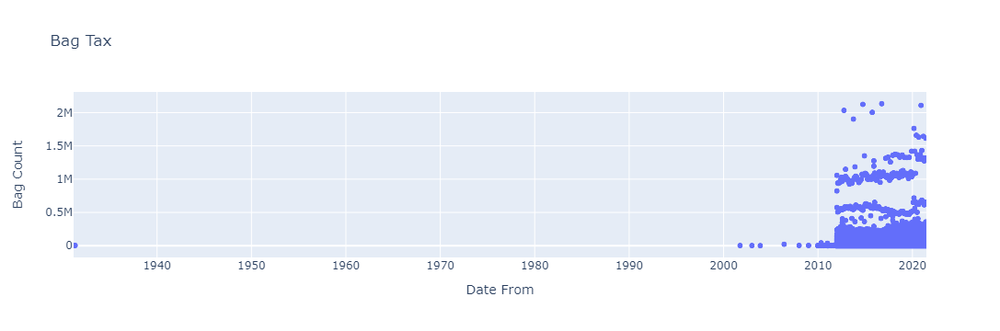

In [4]:
#Make a scatter plot of the data
btfig = px.scatter(data, x='Date From', y='Bag Count', title='Bag Tax')
btfig.update_xaxes(range=['1931-03-01', '2021-06-25'])
btfig.show()

For the following visualizations, I chose to focus on dates between 2012-01-01 and 2021-06-01; 2012 for the start since date points became more regular and abundant.

In [5]:
#Create a list of all of the unique account numbers
Accounts = list(data['Account'].unique())
print(Accounts[0])
len(Accounts)

863


1549

In [6]:
#Group data with the same account number
dataGrouped = dict(tuple(data.groupby('Account')))

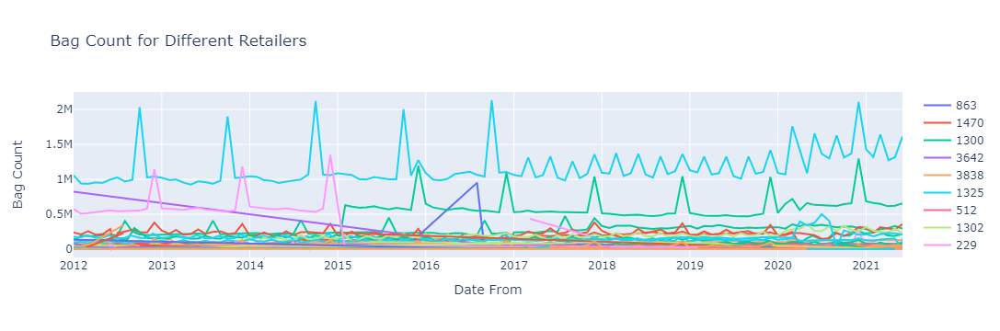

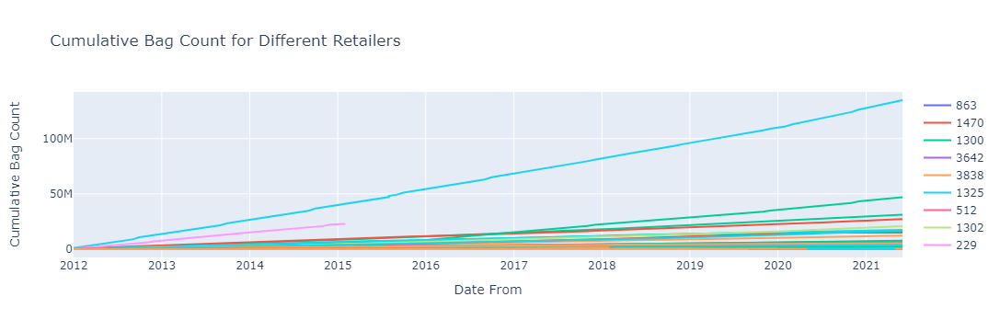

In [7]:
#Graph all accounts, 
bagCountFig = go.Figure()
bagCountCumulativeFig = go.Figure()

i = 10

for acc in Accounts:
    accdata = dataGrouped[acc].copy()
    accdata['Bag Count'] = accdata['Bag Count'];
    accdata = accdata.sort_values(by=['Date From'])
    accdatadiff = accdata.copy()
    accdatadiff = accdatadiff.sort_values(by=['Date From'])
    accdatadiff['Bag Count'] = (accdatadiff['Bag Count']/(accdatadiff['Bag Count'].abs().max()))
    bagCountFig.add_trace(go.Scatter(x=accdata['Date From'], y=accdata['Bag Count'], mode='lines', name=str(acc)))
    bagCountCumulativeFig.add_trace(go.Scatter(x=accdata['Date From'], y=accdata['Bag Count'].cumsum(), mode='lines', name=str(acc)))

bagCountFig.update_xaxes(range=['2012-01-01', '2021-06-01'])
bagCountFig.update_layout(title='Bag Count for Different Retailers', xaxis_title='Date From', yaxis_title='Bag Count')
    
bagCountCumulativeFig.update_xaxes(range=['2012-01-01', '2021-06-01'])
bagCountCumulativeFig.update_layout(title='Cumulative Bag Count for Different Retailers', xaxis_title='Date From', yaxis_title='Cumulative Bag Count')

bagCountFig.show()
bagCountCumulativeFig.show()

Its hard to see an overall trend from the above charts, as there are many accounts and not all of them started reporting in 2012 and/or regularly reported their bag counts. I chose to visualize the data for a few accounts individually to get an idea of the effects of the bag charge from a few cases. Below is a function for visualizing the trends in bag count over time for a single account. 

In [8]:
#Function for visualizing the bag count and the difference given an account number
def VisAccount(acc):
    accBagCountFig = go.Figure() #Figure for showing 'Bag Count' over time
    accBagCountDiffFig = go.Figure() #Figure for showing the difference of 'Bag Count' over time
    accBagCountDiffCumulFig = go.Figure() #Figure for showing the differnece of 'Bag Count' cumulatively over time, to try to smooth the curve/get a better idea of the changes in bag count

    accdata = dataGrouped[acc].copy()
    accdatadiff = dataGrouped[acc].copy()
    accdata['Bag Count'] = accdata['Bag Count']
    accdatadiff['Bag Count'] = accdatadiff['Bag Count'].diff() #Take the difference
    accdata = accdata.sort_values(by=['Date From']) #Sort the data
    accdatadiff = accdatadiff.sort_values(by=['Date From'])
    accdatadiffcumul = accdatadiff.copy()
    accdatadiffcumul['Bag Count'] = accdatadiffcumul['Bag Count'].cumsum() #Cumulative version of the difference
    
    #Add traces to plots
    accBagCountFig.add_trace(go.Scatter(x=accdata['Date From'], y=accdata['Bag Count'], mode='lines', name=str(acc)))
    accBagCountDiffFig.add_trace(go.Scatter(x=accdatadiff['Date From'], y=accdatadiff['Bag Count'], mode='lines', name=str(acc)))
    accBagCountDiffCumulFig.add_trace(go.Scatter(x=accdatadiff['Date From'], y=accdatadiffcumul['Bag Count'], mode='lines', name=str(acc)))
    
    accBagCountFig.update_xaxes(range=['2012-01-01', '2021-06-01'])
    accBagCountFig.update_layout(title="Bag Count of "+str(accdata['Vendor Name'].iloc[0])+", "+str(accdata['Location1'].iloc[0]), xaxis_title='Date', yaxis_title='Bags Bought')

    accBagCountDiffFig.update_xaxes(range=['2012-01-01', '2021-06-01'])
    accBagCountDiffFig.update_layout(title="Difference of the Bag Count of "+str(accdatadiff['Vendor Name'].iloc[0])+", "+str(accdatadiff['Location1'].iloc[0]), xaxis_title='Date', yaxis_title='Difference of Bags Bought')

    accBagCountDiffCumulFig.update_xaxes(range=['2012-01-01', '2021-06-01'])
    accBagCountDiffCumulFig.update_layout(title="Cumulative Difference of the Bag Count of "+str(accdatadiffcumul['Vendor Name'].iloc[0])+", "+str(accdatadiffcumul['Location1'].iloc[0]), xaxis_title='Date', yaxis_title='Cumulative Difference of Bags Bought')
    
    #Trendlines
    #Drop dates that are earlier than 2012-01-01 (so they do not affect the trendlines)
    indexDates = accdata[(accdata['Date From'] < '2012-01-01')].index
    accdata.drop(indexDates , inplace=True)
    accdatadiff.drop(indexDates , inplace=True)
    
    #Create trendlines using plotly express
    trendBagCount = px.scatter(accdata, x='Date From', y='Bag Count', trendline='lowess')
    trendBagCountDiff = px.scatter(accdatadiff, x='Date From', y='Bag Count', trendline='lowess')
    trendBagCountDiffCumul = px.scatter(accdatadiffcumul, x='Date From', y='Bag Count', trendline='lowess')

    #Add trendlines
    accBagCountFig.add_trace(go.Scatter(x = trendBagCount['data'][1]['x'], y = trendBagCount['data'][1]['y'], name = 'trend'))
    accBagCountDiffFig.add_trace(go.Scatter(x = trendBagCountDiff['data'][1]['x'], y = trendBagCountDiff['data'][1]['y'], name = 'trend'))
    accBagCountDiffCumulFig.add_trace(go.Scatter(x = trendBagCountDiffCumul['data'][1]['x'], y = trendBagCountDiffCumul['data'][1]['y'], name = 'trend'))
    
    #Show plots
    accBagCountFig.show()
    accBagCountDiffFig.show()
    accBagCountDiffCumulFig.show()

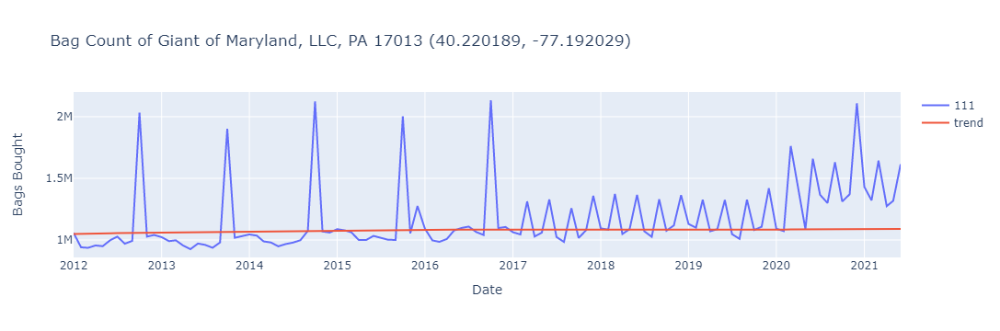

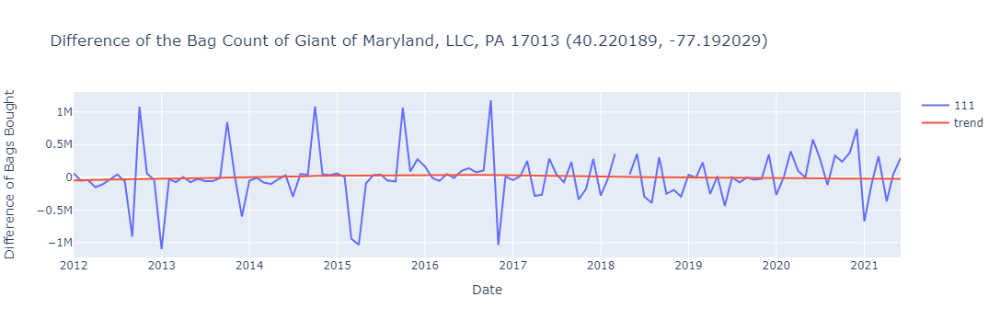

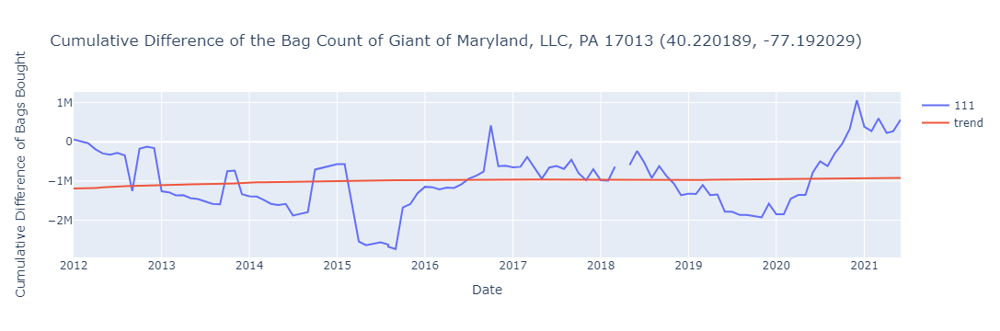

In [9]:
VisAccount(111)

The charts above are for the account with the largest cumulative count of plastic bags, the Giant of Maryland grocery store company. It appears that the charge may have slowed the increase in plastic bag usage, however in 2018 and again 2020 it gradually began to pickup again. This may be due to people getting used to the bag charge and ignoring it. In 2020/2021, it may have been because people were grocery shopping more after the start of the COVID19 pandemic (since many restaurants were closed).

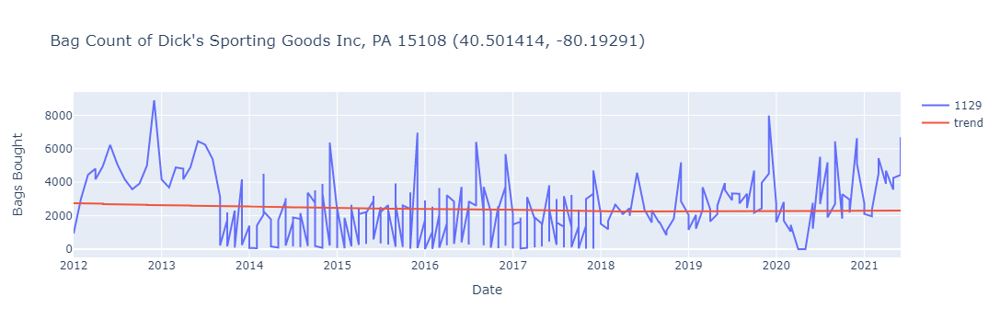

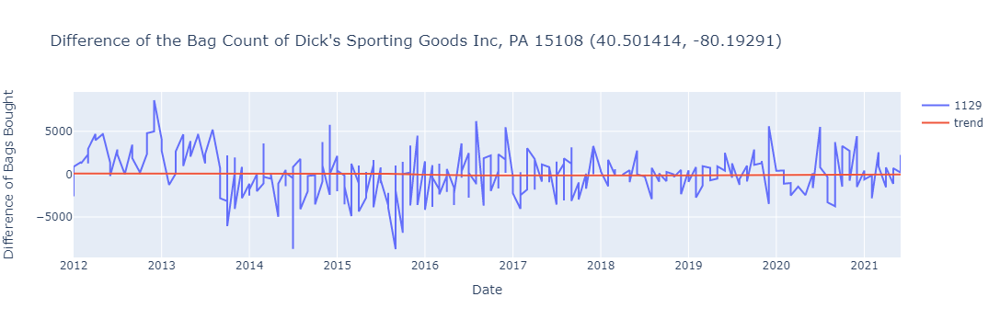

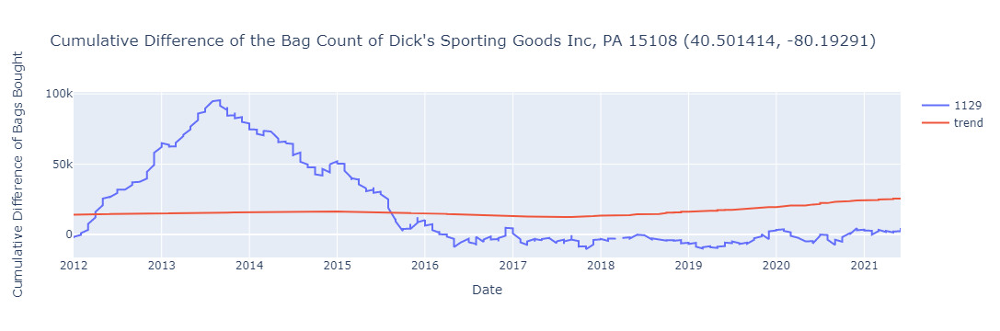

In [10]:
VisAccount(1129)

For Dick's Sporting Goods, there was a noticeable decrease in the rate at which the number of bags bought was increasing starting around mid 2013. Following the trendline in the difference plot, the bag count began to decrease around mid to late 2015. However, the difference plot flattens around the start of 2018 and begins to increase afterwards (while still negative). The initial decline may have been due to the bag tax, a change in consumer behavior due to continuing discussions about plastic bag charges and bans, or maybe an unrelated reason, such as competition with other stores or online retailers. If the main factor was the bag tax, then the increase in the difference after 2018 may be due to a similar reason to the Giant of Maryland, that people became used to the tax and began to ignore it.

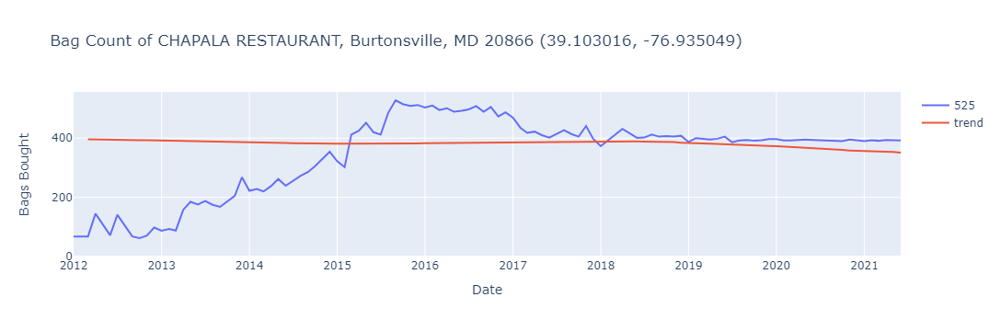

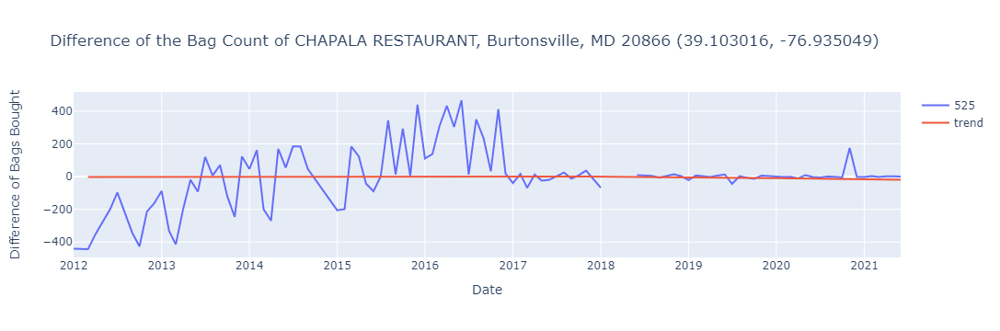

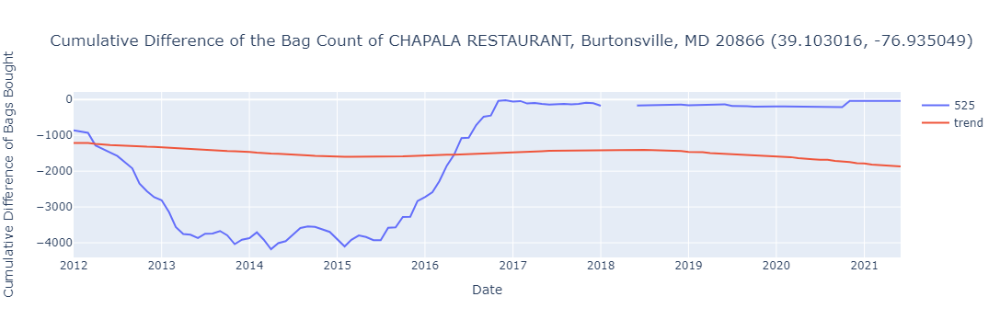

In [11]:
VisAccount(525)

The bag usage plateaued for the Chapala Restaurant around 2017.

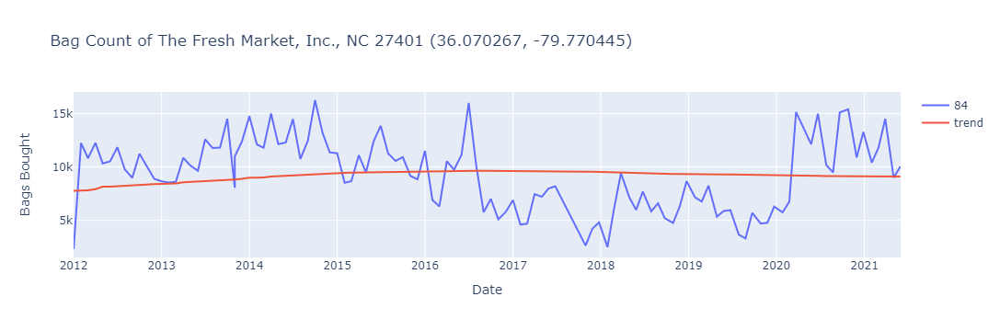

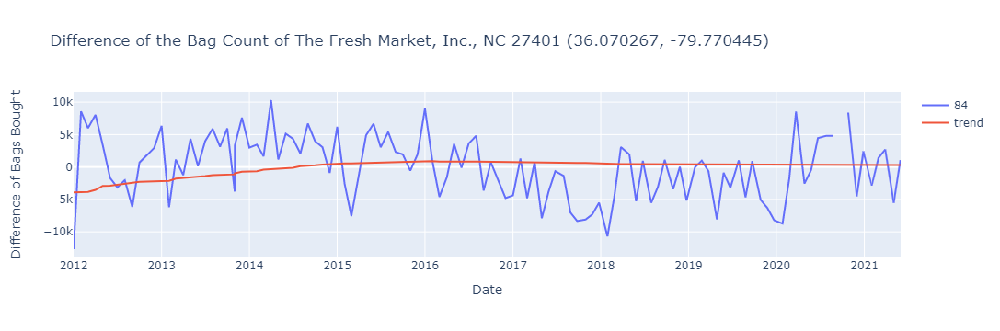

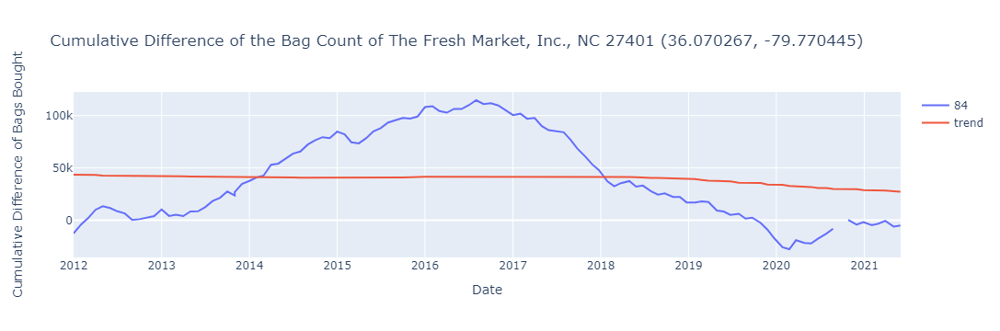

In [12]:
VisAccount(84)

The bag counts at Fresh Market seem to share similarities with the earlier graphs; an increase that plateaus and begins to decrease around 2016, followed by an increase starting in 2020.

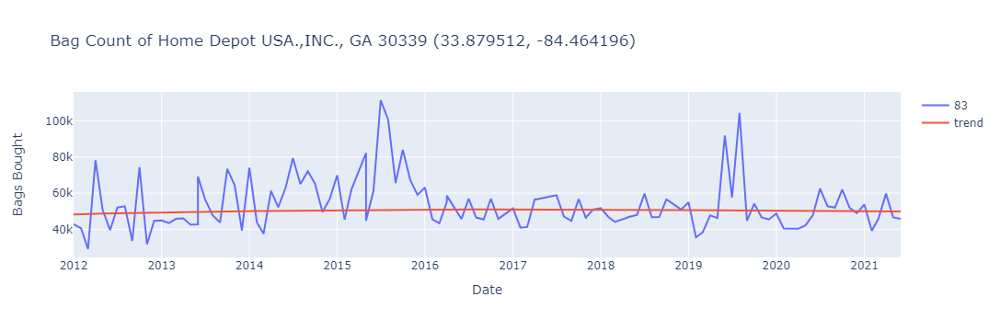

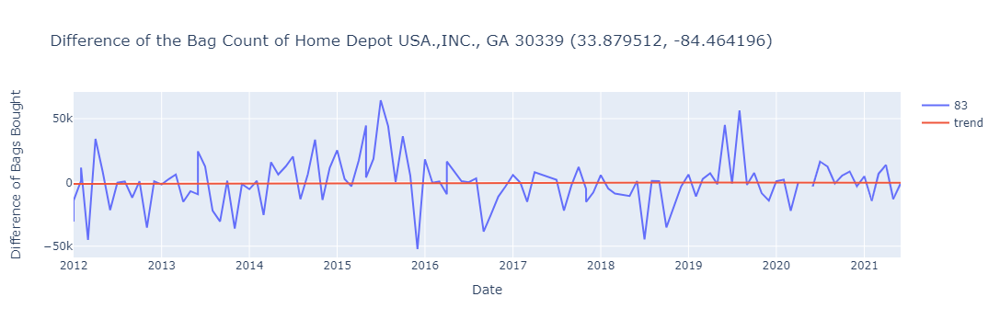

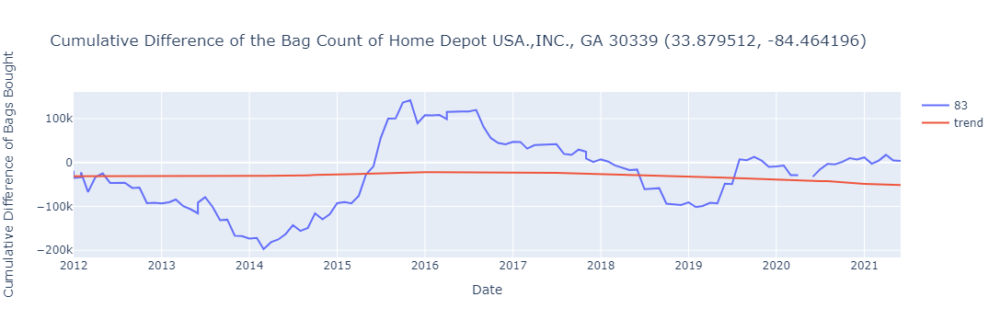

In [13]:
VisAccount(83)

The Home Depot's bag counts increased at first and then plateaued and began to decrease around 2016

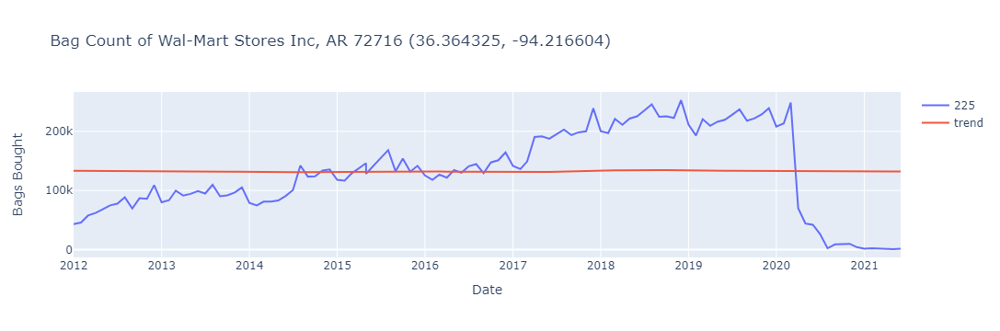

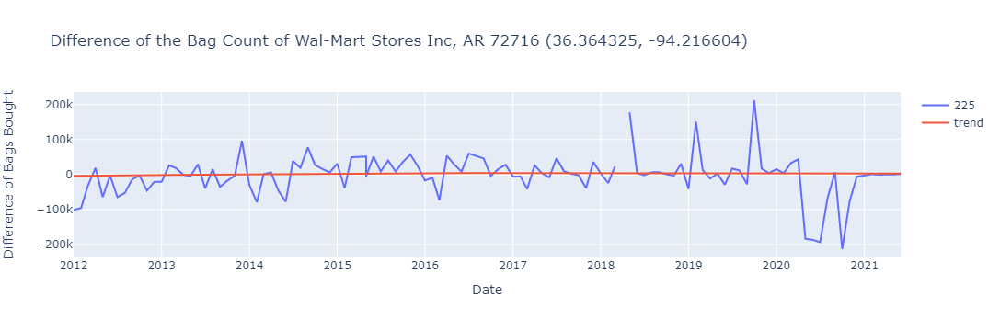

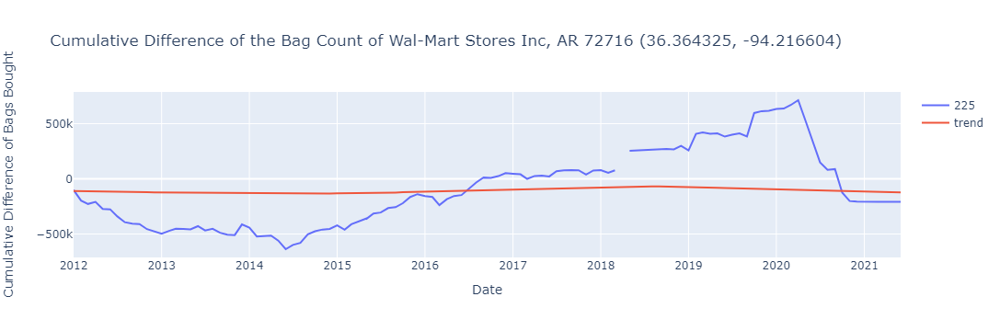

In [14]:
VisAccount(225)

The bag count at Walmart seemed to consistently increase until April 2020.

## Conclusion
It is difficult to tell if the plastic bag tax in Montgomery had any effect on the use of plastic bags in stores. From the plots above, bag counts plateaued or even decreased in some of the stores for a few years after the introduction of the tax, but began to increase again starting around 2019. These trends could have been due to reasons other than the bag tax, such as changes in population or competition with other stores or online retailers. However, if we assume that the trends are due largely to the bag tax, it seems to have had little effect on consumer behavior after the first years after it's introduction. This may be due to consumers getting used to the tax and ignoring it, the tax not being a large enough incentive to switch to reusable bags, or that a bag tax in one county isn't enough to change the usage of plastic bags.

# Review of the "Bag-Tax" Dataset

I found the Bag Tax data set on data.gov, which links to the landing page of the dataset on Montgomery County’s “dataMongomery” website. It was created and is maintained by the Montgomery County of Maryland. The description provided on dataMontgomery briefly explains the plastic bag charge law that was passed in 2011, and that the dataset represents information that been captured since the law went into effect. It also lists the columns in the dataset and provides a brief description of each of them. 

## FAIR - Reuse Principle

The column descriptions provided on the site greatly help the data fulfill the FAIR Reuse principle. However, while using the data, I found that some of the dates in the .csv file were from before May 3rd, 2011, the start of the bag tax law. One of the records was from as early as 1931. This conflicted with the description with the dataset and was confusing to me since some accounts appeared to be reporting bag counts and tax collection before the law was implemented. I chose to ignore data before 2012 in my code to reduce the possible effects that these inconsistent data points could have on the trendlines in the visualizations. I would suggest explaining this in somewhere in the dataset’s metadata, as it would clarify the inconsistency and may give future users more confidence in the accuracy of the data closer to May 2011. 

There were also a few typos in the original csv I downloaded, which I found when converting the “Dates To” column to Pandas’ date time format. A few of the dates were from 2031, which didn’t affect my results, but did cause python to throw an error while converting the dates. The error was easily fixed by manually changing the dates to be in 2021, but to be safe the dataset should be reviewed and corrected by the maintainers.